# PRCP-1023-JohnsHopkinsCovid19

# Problem Statement
### Task 1:- Prepare a complete data analysis report on the given data.
### Task 2:- Fix a period for prediction of confirmed cases/deaths. Create a
### predictive model to forecast the Covid19 cases based on past cases for a
### specific country or region.
### Task3:- Make suggestions to the government health department of the
### country/region for preparation based on your predictions.

## Importing necessary packages

In [3]:
# imports
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import folium


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

import math
import random
from datetime import timedelta

import warnings
warnings.filterwarnings('ignore')

#color pallette
cnf = '#393e46'
dth = '#ff2e63'
rec = '#21bf73'
act = '#fe9801'

In [3]:


import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import random
import math 
import time
import wget
# import altair as alt
import plotly.express as px
import datetime 
import operator



## Reading data

### Confirmed dataset

In [8]:
confirmed_df = pd.read_csv('time_series_covid19_confirmed_global.csv')
confirmed_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,38641,38716,38772,38815,38855,38872,38883,38919,39044,39074
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,11185,11353,11520,11672,11816,11948,12073,12226,12385,12535
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,48007,48254,48496,48734,48966,49194,49413,49623,49826,50023
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,1344,1344,1438,1438,1483,1483,1564,1564,1564,1681
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,3335,3388,3439,3569,3675,3789,3848,3901,3991,4117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,29906,30574,31362,32250,33006,33843,34401,35003,35686,36151
262,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,10,10,10,10,10,10,10,10,10,10
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,2009,2011,2013,2016,2019,2022,2024,2026,2026,2028
264,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,13466,13539,13720,13819,13887,13928,14022,14070,14131,14175


In [14]:
confirmed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


### Deaths

In [15]:
deaths_df = pd.read_csv('time_series_covid19_deaths_global.csv')
deaths_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,1420,1420,1425,1426,1436,1436,1437,1437,1441,1444
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,330,334,338,340,343,347,353,358,362,364
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,1605,1612,1620,1632,1645,1654,1659,1665,1672,1679
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,53,53,53,53,53,53,53,53,53,53
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,132,134,136,139,143,144,147,147,152,154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,210,221,226,229,243,244,250,253,262,265
262,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,582,583,583,583,583,585,585,585,586,586
264,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,312,312,320,324,326,326,329,330,330,331


In [16]:
deaths_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266 entries, 0 to 265
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 515.5+ KB


### Recovered

In [17]:
recovered_df = pd.read_csv('time_series_covid19_recovered_global.csv')
recovered_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,31234,31638,32073,32098,32503,32505,32576,32576,32576,32576
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,6494,6569,6615,6668,6733,6788,6831,6888,6940,6995
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,33875,34037,34204,34385,34517,34675,34818,34923,35047,35180
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,943,943,945,945,1054,1054,1164,1164,1164,1199
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,1289,1301,1324,1332,1401,1405,1443,1445,1445,1449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,19979,20082,21406,21804,22209,23060,23333,23446,23700,24428
249,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,8,8,8,8,8,8,8,8,8,8
250,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,1211,1212,1215,1219,1221,1221,1221,1221,1227,1235
251,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,12007,12260,12380,12590,12869,13029,13207,13365,13365,13629


In [18]:
recovered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253 entries, 0 to 252
Columns: 248 entries, Province/State to 9/21/20
dtypes: float64(2), int64(244), object(2)
memory usage: 490.3+ KB


### Preparing the dataset
1. Changing dates features into rows by using melt function

In [19]:
dates = confirmed_df.columns[4:]
confirmed_df1 = confirmed_df.melt(
    id_vars = ['Province/State', 'Country/Region', 'Lat','Long'],
    value_vars = dates,
    var_name ='Date',
    value_name = 'Confirmed'
)
deaths_df1 = deaths_df.melt(
        id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
        value_vars=dates, 
        var_name='Date', 
        value_name='Deaths'
)

recovered_df1 = recovered_df.melt(
        id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], 
        value_vars=dates, 
        var_name='Date', 
        value_name='Recovered'
    )



In [20]:
df = confirmed_df1.merge(
  right=deaths_df1, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)

df = df.merge(
  right=recovered_df1, 
  how='left',
  on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long']
)

In [23]:
df['Province/State'] = df['Province/State'].fillna("")
df['Date'] = pd.to_datetime(df['Date'])
df['Recovered'] = df['Recovered'].fillna(0)
df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0.0
1,,Albania,41.15330,20.168300,2020-01-22,0,0,0.0
2,,Algeria,28.03390,1.659600,2020-01-22,0,0,0.0
3,,Andorra,42.50630,1.521800,2020-01-22,0,0,0.0
4,,Angola,-11.20270,17.873900,2020-01-22,0,0,0.0


### Renaming the columns

In [24]:
df = df.rename(columns = {'Country/Region':'Country'})

### Checking null values

In [25]:
df.isnull().sum()

Province/State    0
Country           0
Lat               0
Long              0
Date              0
Confirmed         0
Deaths            0
Recovered         0
dtype: int64

# Total Cases on ships

In [26]:
df.columns

Index(['Province/State', 'Country', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered'],
      dtype='object')

In [27]:
df['Date'] = pd.to_datetime(df['Date'])
df['Recovered'] = df['Recovered'].fillna(0)

ship_rows = df['Province/State'].str.contains('Grand Princess') | df['Province/State'].str.contains('Diamond Princess') | df['Country'].isin(['Grand Princess', 'Diamond Princess', 'MS Zaandam'])
ship = df[ship_rows]

df = df[~(ship_rows)]


In [28]:
ship.head()

,Province/State,Country,Lat,Long,Date,Confirmed,Deaths,Recovered
41,Diamond Princess,Canada,0.0,0.0,2020-01-22,0,0,0.0
42,Grand Princess,Canada,0.0,0.0,2020-01-22,0,0,0.0
102,,Diamond Princess,0.0,0.0,2020-01-22,0,0,0.0
168,,MS Zaandam,0.0,0.0,2020-01-22,0,0,0.0
307,Diamond Princess,Canada,0.0,0.0,2020-01-23,0,0,0.0


In [29]:
df.head()

,Province/State,Country,Lat,Long,Date,Confirmed,Deaths,Recovered
0,,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0.0
1,,Albania,41.15330,20.168300,2020-01-22,0,0,0.0
2,,Algeria,28.03390,1.659600,2020-01-22,0,0,0.0
3,,Andorra,42.50630,1.521800,2020-01-22,0,0,0.0
4,,Angola,-11.20270,17.873900,2020-01-22,0,0,0.0


### Extracting new features from the old features

In [30]:
df['Active'] = df['Confirmed'] - df['Deaths'] - df['Recovered']

full_grouped = df.groupby(['Date', 'Country'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
full_grouped

,Date,Country,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0.0,0.0
1,2020-01-22,Albania,0,0,0.0,0.0
2,2020-01-22,Algeria,0,0,0.0,0.0
3,2020-01-22,Andorra,0,0,0.0,0.0
4,2020-01-22,Angola,0,0,0.0,0.0
...,...,...,...,...,...,...
45379,2020-09-21,West Bank and Gaza,36151,265,24428.0,11458.0
45380,2020-09-21,Western Sahara,10,1,8.0,1.0
45381,2020-09-21,Yemen,2028,586,1235.0,207.0
45382,2020-09-21,Zambia,14175,331,13629.0,215.0


In [31]:
temp = full_grouped.groupby(['Country', 'Date', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Country'] != temp['Country'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan
temp.columns = ['Country', 'Date', 'New cases', 'New deaths', 'New recovered']

full_grouped = pd.merge(full_grouped, temp, on=['Country', 'Date'])

full_grouped = full_grouped.fillna(0)
cols = ['New cases', 'New deaths', 'New recovered']
full_grouped[cols] = full_grouped[cols].astype('int')
# 
full_grouped['New cases'] = full_grouped['New cases'].apply(lambda x: 0 if x<0 else x)
full_grouped.head()

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
0,2020-01-22,Afghanistan,0,0,0.0,0.0,0,0,0
1,2020-01-22,Albania,0,0,0.0,0.0,0,0,0
2,2020-01-22,Algeria,0,0,0.0,0.0,0,0,0
3,2020-01-22,Andorra,0,0,0.0,0.0,0,0,0
4,2020-01-22,Angola,0,0,0.0,0.0,0,0,0


## Creating new datasets
1. Recovered
2. Deaths
3. Confirmed
4. Active

In [32]:
recovered = full_grouped.groupby('Date').sum()['Recovered'].reset_index()
deaths = full_grouped.groupby('Date').sum()['Deaths'].reset_index()
confirmed = full_grouped.groupby('Date').sum()['Confirmed'].reset_index()
active = full_grouped.groupby('Date').sum()['Active'].reset_index()

In [33]:
recovered.head()

,Date,Recovered
0,2020-01-22,28.0
1,2020-01-23,30.0
2,2020-01-24,36.0
3,2020-01-25,39.0
4,2020-01-26,52.0


In [34]:
confirmed.tail()

,Date,Confirmed
239,2020-09-17,30174579
240,2020-09-18,30498800
241,2020-09-19,30780021
242,2020-09-20,31021238
243,2020-09-21,31245063


In [35]:
deaths.head()

,Date,Deaths
0,2020-01-22,17
1,2020-01-23,18
2,2020-01-24,26
3,2020-01-25,42
4,2020-01-26,56


In [36]:
active.head()

,Date,Active
0,2020-01-22,510.0
1,2020-01-23,606.0
2,2020-01-24,879.0
3,2020-01-25,1353.0
4,2020-01-26,2010.0


# Exploratory data analysis

## Cases through time

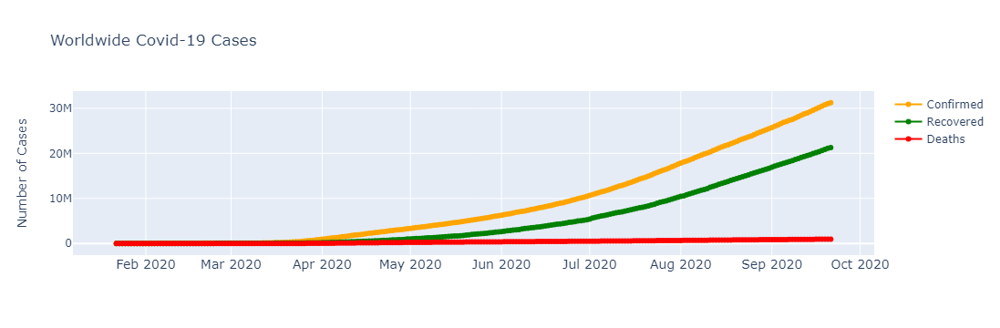

In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = confirmed['Date'], y = confirmed['Confirmed'], mode = 'lines+markers', name = 'Confirmed', line = dict(color = "Orange", width = 2)))
fig.add_trace(go.Scatter(x = recovered['Date'], y = recovered['Recovered'], mode = 'lines+markers', name = 'Recovered', line = dict(color = "Green", width = 2)))
fig.add_trace(go.Scatter(x = deaths['Date'], y = deaths['Deaths'], mode = 'lines+markers', name = 'Deaths', line = dict(color = "Red", width = 2)))
fig.update_layout(title = 'Worldwide Covid-19 Cases', xaxis_tickfont_size = 14, yaxis = dict(title = 'Number of Cases'))

fig.show()

# Cases Over the Time with Area Plot

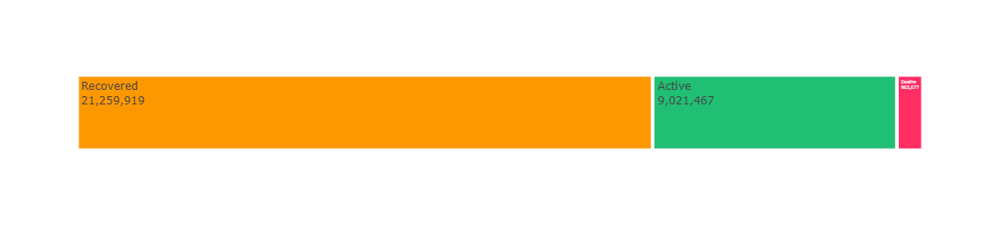

In [28]:
temp = df.groupby('Date')['Confirmed', 'Deaths','Recovered', 'Active'].sum().reset_index()
temp = temp[temp['Date']==max(temp['Date'])].reset_index(drop = True)


x = temp.melt(id_vars = 'Date', value_vars = ['Active', 'Deaths','Recovered'])
fig = px.treemap(x, path = ['variable'], values = 'value', height = 250, width = 800, color_discrete_sequence = [act, rec, dth]  )
fig.data[0].textinfo = 'label+text+value'
fig.show()

#  Cases over time

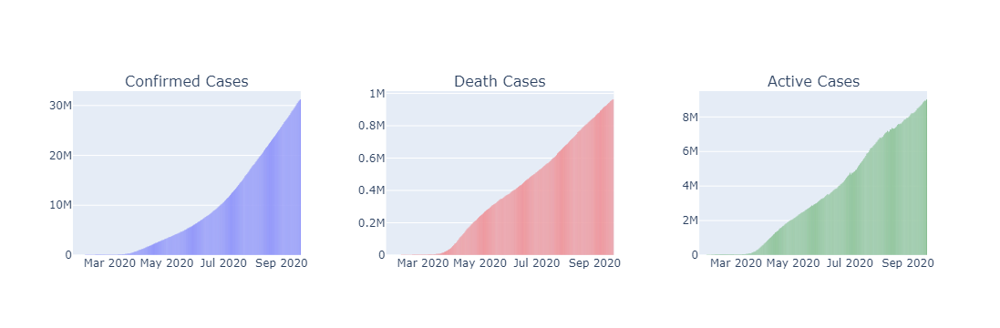

In [29]:
from plotly.subplots import make_subplots
import plotly.express as px

# Assuming confirmed, deaths, active are DataFrames with columns 'Date', 'Confirmed', 'Deaths', 'Active'

fig_c = px.bar(confirmed, x='Date', y='Confirmed', color_discrete_sequence=['blue'])
fig_d = px.bar(deaths, x='Date', y='Deaths', color_discrete_sequence=['red'])
fig_a = px.bar(active, x='Date', y='Active', color_discrete_sequence=['green'])

fig = make_subplots(rows=1, cols=3, shared_xaxes=False, horizontal_spacing=0.1,
                    subplot_titles=('Confirmed Cases', 'Death Cases', 'Active Cases'))

# Adding traces to the subplots using the data attribute from each Plotly Express figure
for trace in fig_c['data']:
    fig.add_trace(trace, row=1, col=1)

for trace in fig_d['data']:
    fig.add_trace(trace, row=1, col=2)

for trace in fig_a['data']:
    fig.add_trace(trace, row=1, col=3)

fig.update_layout(height=400)
fig.show()


In [30]:
full_grouped.sort_values(by = 'Confirmed', ascending=False)

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
45370,2020-09-21,US,6856884,199865,2615949.0,4041070.0,52070,356,25278
45184,2020-09-20,US,6804814,199509,2590671.0,4014634.0,36695,227,13225
44998,2020-09-19,US,6768119,199282,2577446.0,3991391.0,44186,712,20981
44812,2020-09-18,US,6723933,198570,2556465.0,3968898.0,49522,937,16131
44626,2020-09-17,US,6674411,197633,2540334.0,3936444.0,44360,870,14761
...,...,...,...,...,...,...,...,...,...
3221,2020-02-08,Fiji,0,0,0.0,0.0,0,0,0
6645,2020-02-26,Portugal,0,0,0.0,0.0,0,0,0
3224,2020-02-08,Gabon,0,0,0.0,0.0,0,0,0
3225,2020-02-08,Gambia,0,0,0.0,0.0,0,0,0


## Folium map

In [39]:
temp = df[df['Date']==max(df['Date'])]

m = folium.Map(location=[0, 0], tiles='cartodbpositron', min_zoom = 1, max_zoom=4, zoom_start=1)

for i in range(0, len(temp)):
    folium.Circle(location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']], color = 'crimson', fill = 'crimson',
                 tooltip = '<li><bold> Country: ' + str(temp.iloc[i]['Country'])+
                            '<li><bold> Province: ' + str(temp.iloc[i]['Province/State'])+
                             '<li><bold> Confirmed: ' + str(temp.iloc[i]['Confirmed'])+
                             '<li><bold> Deaths: ' + str(temp.iloc[i]['Deaths']),
                 radius = int(temp.iloc[i]['Confirmed'])**0.5).add_to(m)
    

m

# Let's extract some more information from the original data 

In [40]:
daywise = full_grouped.groupby("Date").agg({
    'Confirmed': 'sum',
    'Deaths': 'sum',
    'Recovered': 'sum',  
    'Active': 'sum',
    'New cases':'sum',
}).reset_index()
daywise.head()

,Date,Confirmed,Deaths,Recovered,Active,New cases
0,2020-01-22,555,17,28.0,510.0,0
1,2020-01-23,654,18,30.0,606.0,99
2,2020-01-24,941,26,36.0,879.0,287
3,2020-01-25,1434,42,39.0,1353.0,493
4,2020-01-26,2118,56,52.0,2010.0,684


In [42]:
daywise['Deaths/100'] = daywise['Deaths']/daywise['Confirmed']*100
daywise['Recovered/100'] = daywise['Recovered']/daywise['Confirmed']*100



In [45]:
daywise['Deaths/100 recovered'] = (daywise['Deaths'] / daywise['Recovered']) * 100

In [46]:
daywise.sort_values(by = 'Confirmed', ascending=False)

,Date,Confirmed,Deaths,Recovered,Active,New cases,Deaths/100,Recovered/100,Deaths/100 recovered
243,2020-09-21,31245063,963677,21259919.0,9021467.0,223825,3.084254,68.042490,4.532835
242,2020-09-20,31021238,960679,21119368.0,8941191.0,241217,3.096843,68.080352,4.548806
241,2020-09-19,30780021,956983,20883978.0,8939060.0,281221,3.109104,67.849135,4.582379
240,2020-09-18,30498800,951751,20646629.0,8900420.0,324221,3.120618,67.696529,4.609716
239,2020-09-17,30174579,946045,20395618.0,8832916.0,313364,3.135238,67.592055,4.638472
...,...,...,...,...,...,...,...,...,...
4,2020-01-26,2118,56,52.0,2010.0,684,2.644004,2.455146,107.692308
3,2020-01-25,1434,42,39.0,1353.0,493,2.928870,2.719665,107.692308
2,2020-01-24,941,26,36.0,879.0,287,2.763018,3.825717,72.222222
1,2020-01-23,654,18,30.0,606.0,99,2.752294,4.587156,60.000000


# Deaths and Recoveries per 100 Cases

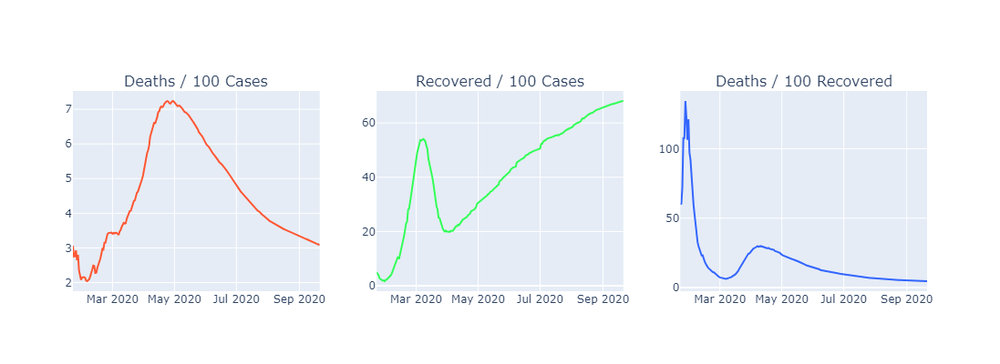

In [47]:
import plotly.express as px
from plotly.subplots import make_subplots

# Assuming you have 'daywise' DataFrame containing necessary columns

fig1 = px.line(daywise, x='Date', y='Deaths/100', color_discrete_sequence=['#FF5733'])
fig2 = px.line(daywise, x='Date', y='Recovered/100', color_discrete_sequence=['#33FF57'])
fig3 = px.line(daywise, x='Date', y='Deaths/100 recovered', color_discrete_sequence=['#3366FF'])


# Create subplots
fig = make_subplots(rows=1, cols=3, shared_xaxes=False,
                    subplot_titles=('Deaths / 100 Cases', 'Recovered / 100 Cases', 'Deaths / 100 Recovered'))

# Add traces directly to subplots
for trace in fig1.data:
    fig.add_trace(trace, row=1, col=1)

for trace in fig2.data:
    fig.add_trace(trace, row=1, col=2)

for trace in fig3.data:
    fig.add_trace(trace, row=1, col=3)

fig.update_layout(height=400)
fig.show()


In [48]:
full_grouped['Date'].max()

Timestamp('2020-09-21 00:00:00')

In [49]:
full_grouped.head()

,Date,Country,Confirmed,Deaths,Recovered,Active,New cases,New deaths,New recovered
0,2020-01-22,Afghanistan,0,0,0.0,0.0,0,0,0
1,2020-01-22,Albania,0,0,0.0,0.0,0,0,0
2,2020-01-22,Algeria,0,0,0.0,0.0,0,0,0
3,2020-01-22,Andorra,0,0,0.0,0.0,0,0,0
4,2020-01-22,Angola,0,0,0.0,0.0,0,0,0


## Total cases by country
1. Making a new dataset as country_wise

In [50]:
latest_per_country = full_grouped.groupby('Country')['Date'].idxmax()
country_wise = full_grouped.loc[latest_per_country][['Country', 'Confirmed', 'Recovered', 'Deaths', 'Active']]
# country_wise.drop('index', axis = 1, inplace = True)
country_wise = country_wise.reset_index()
country_wise.drop(columns = ['index'], inplace = True, axis = 1)
country_wise

,Country,Confirmed,Recovered,Deaths,Active
0,Afghanistan,39074,32576.0,1444,5054.0
1,Albania,12535,6995.0,364,5176.0
2,Algeria,50023,35180.0,1679,13164.0
3,Andorra,1681,1199.0,53,429.0
4,Angola,4117,1449.0,154,2514.0
...,...,...,...,...,...
181,West Bank and Gaza,36151,24428.0,265,11458.0
182,Western Sahara,10,8.0,1,1.0
183,Yemen,2028,1235.0,586,207.0
184,Zambia,14175,13629.0,331,215.0


### Extracting new cases in country wise dataset

In [55]:
country_wise['Deaths/100'] = country_wise['Deaths']/country_wise['Confirmed']*100
country_wise['Recovered/100'] = country_wise['Recovered']/country_wise['Confirmed']*100
country_wise['Deaths/100'] = country_wise['Deaths']/country_wise['Confirmed']*100


In [52]:
country_wise.sort_values(by = 'Confirmed', ascending=False)

,Country,Confirmed,Recovered,Deaths,Active,Deaths/100,Recovered/100
172,US,6856884,2615949.0,199865,4041070.0,2.914808,38.150696
78,India,5487580,4396399.0,87882,1003299.0,1.601471,80.115443
23,Brazil,4558040,3993432.0,137272,427336.0,3.011645,87.612921
138,Russia,1105048,909026.0,19420,176602.0,1.757390,82.261223
37,Colombia,770435,640900.0,24397,105138.0,3.166653,83.186771
...,...,...,...,...,...,...,...
68,Grenada,24,24.0,0,0.0,0.000000,100.000000
94,Laos,23,22.0,0,1.0,0.000000,95.652174
140,Saint Kitts and Nevis,19,17.0,0,2.0,0.000000,89.473684
74,Holy See,12,12.0,0,0.0,0.000000,100.000000


# Top 15 Countries Case Analysis

In [53]:
def plot_countrywise_metrics(country_wise, top=15):
    fig_c = px.bar(country_wise.sort_values('Confirmed').tail(top), x='Confirmed', y='Country',
                   text='Confirmed', orientation='h')
    fig_d = px.bar(country_wise.sort_values('Deaths').tail(top), x='Deaths', y='Country',
                   text='Deaths', orientation='h')

    fig_a = px.bar(country_wise.sort_values('Active').tail(top), x='Active', y='Country',
                   text='Active', orientation='h')
    fig_r = px.bar(country_wise.sort_values('Recovered').tail(top), x='Recovered', y='Country',
                   text='Recovered', orientation='h')

    fig_dc = px.bar(country_wise.sort_values('Deaths/100').tail(top), x='Deaths/100', y='Country',
                    text='Deaths/100', orientation='h')
    fig_rc = px.bar(country_wise.sort_values('Recovered/100').tail(top), x='Recovered/100', y='Country',
                    text='Recovered/100', orientation='h')

    fig = make_subplots(rows=3, cols=2, shared_xaxes=False, horizontal_spacing=0.2,
                        vertical_spacing=0.05,
                        subplot_titles=('Confirmed Cases', 'Deaths Reported', 'Recovered Cases', 'Active Cases',
                                        'Deaths / 100 Cases', 'Recovered / 100 Cases'))

    fig.add_trace(fig_c['data'][0], row=1, col=1)
    fig.add_trace(fig_d['data'][0], row=1, col=2)

    fig.add_trace(fig_r['data'][0], row=2, col=1)
    fig.add_trace(fig_a['data'][0], row=2, col=2)

    fig.add_trace(fig_dc['data'][0], row=3, col=1)
    fig.add_trace(fig_rc['data'][0], row=3, col=2)

    fig.update_layout(height=1500)
    fig.show()


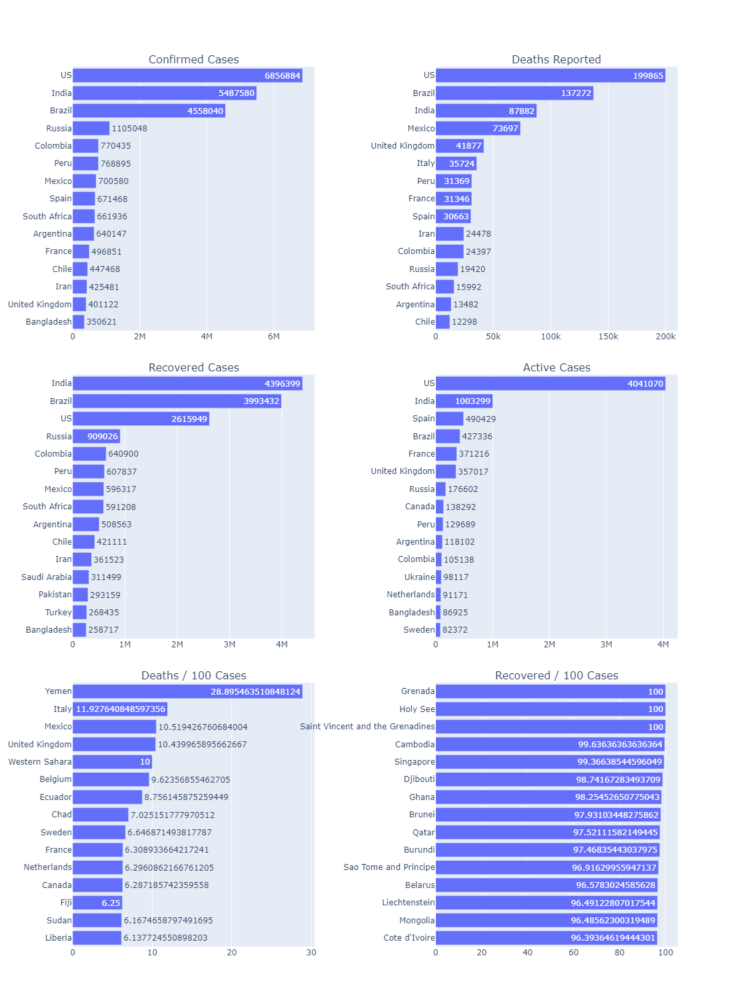

In [54]:
plot_countrywise_metrics(country_wise)

# Confirmed, Deaths, New Cases vs Country and Date¶

### Lineplot

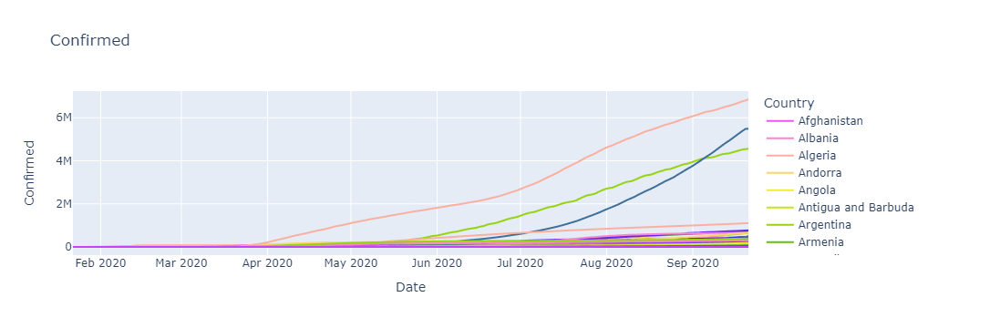

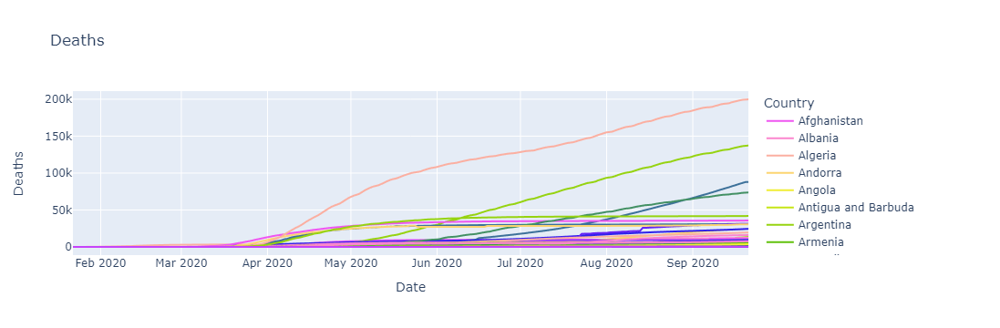

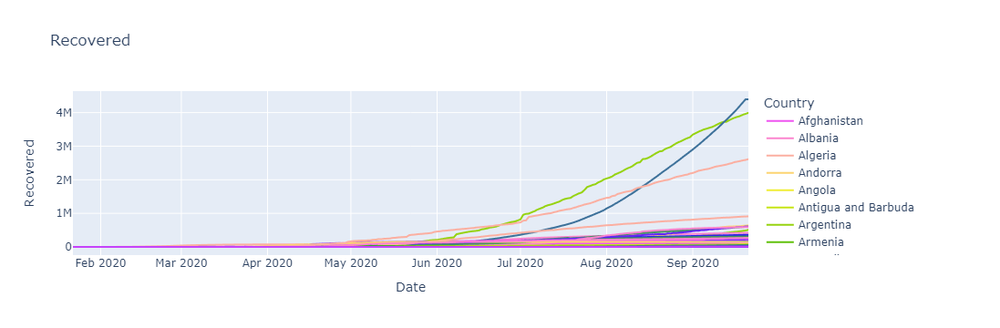

In [50]:
fig = px.line(full_grouped, x = 'Date', y = 'Confirmed', color = 'Country', height = 600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

fig = px.line(full_grouped, x = 'Date', y = 'Deaths', color = 'Country', height = 600,
             title='Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

fig = px.line(full_grouped, x = 'Date', y = 'Recovered', color = 'Country', height = 600,
             title='Recovered', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

### Insights
1. USA has more confirmed and death cases
2. India, and Brazil has more Recovered cases

In [56]:
df.columns

Index(['Province/State', 'Country', 'Lat', 'Long', 'Date', 'Confirmed',
       'Deaths', 'Recovered', 'Active'],
      dtype='object')

## Tree map analysis

### Confirmed Cases

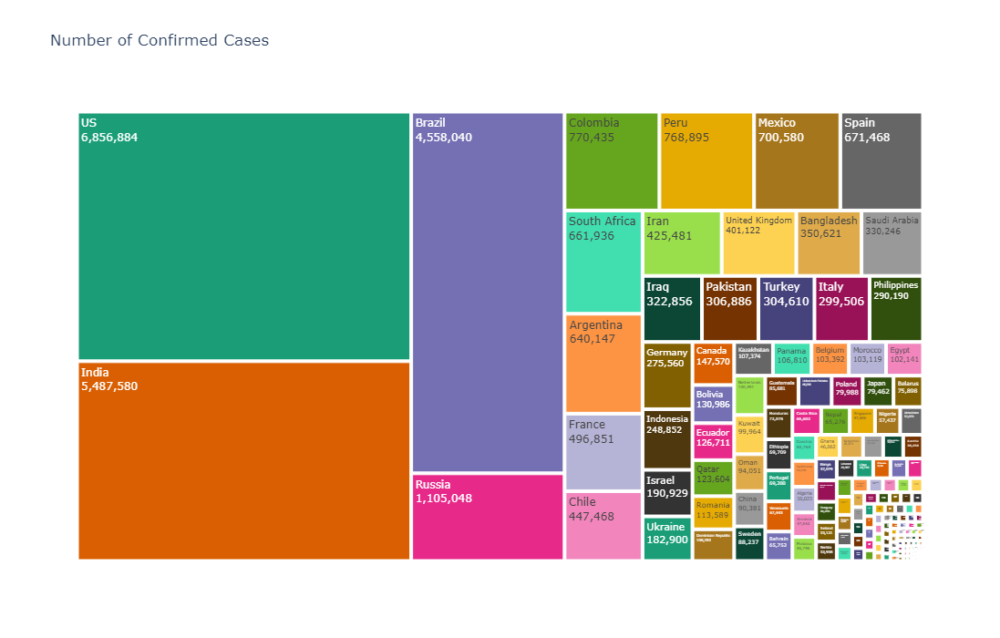

In [57]:
import plotly.express as px


# Create the treemap
fig = px.treemap(country_wise.sort_values(by='Confirmed', ascending=False).reset_index(drop=True),
                 path=['Country'], values='Confirmed', height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence=px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'
fig.show()


### Recovered Cases

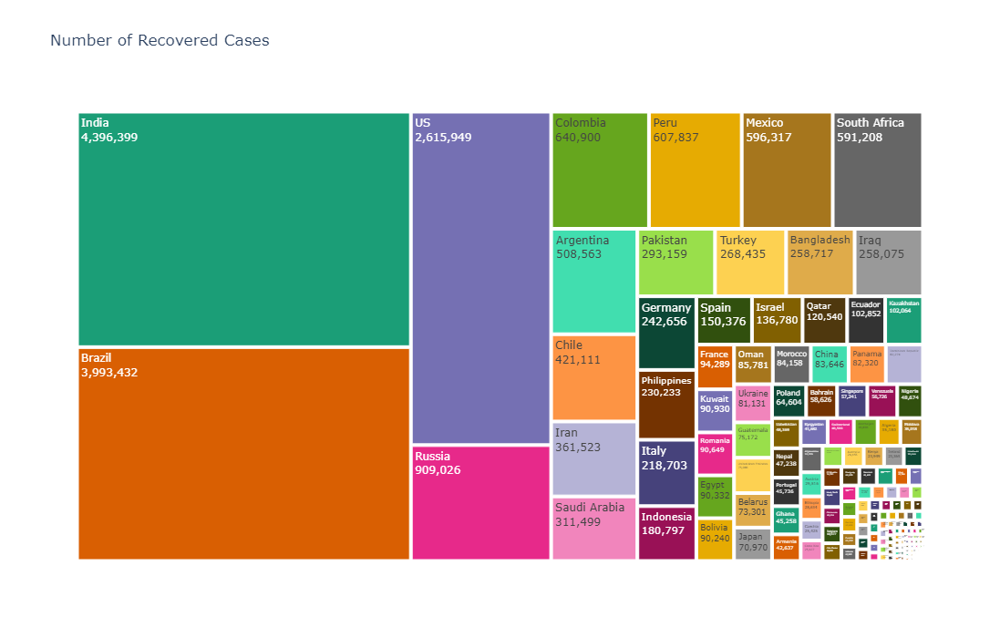

In [58]:
fig = px.treemap(country_wise.sort_values(by='Recovered', ascending=False).reset_index(drop=True),
                 path=['Country'], values='Recovered', height=700,
                 title='Number of Recovered Cases',
                 color_discrete_sequence=px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'
fig.show()


### Death Cases

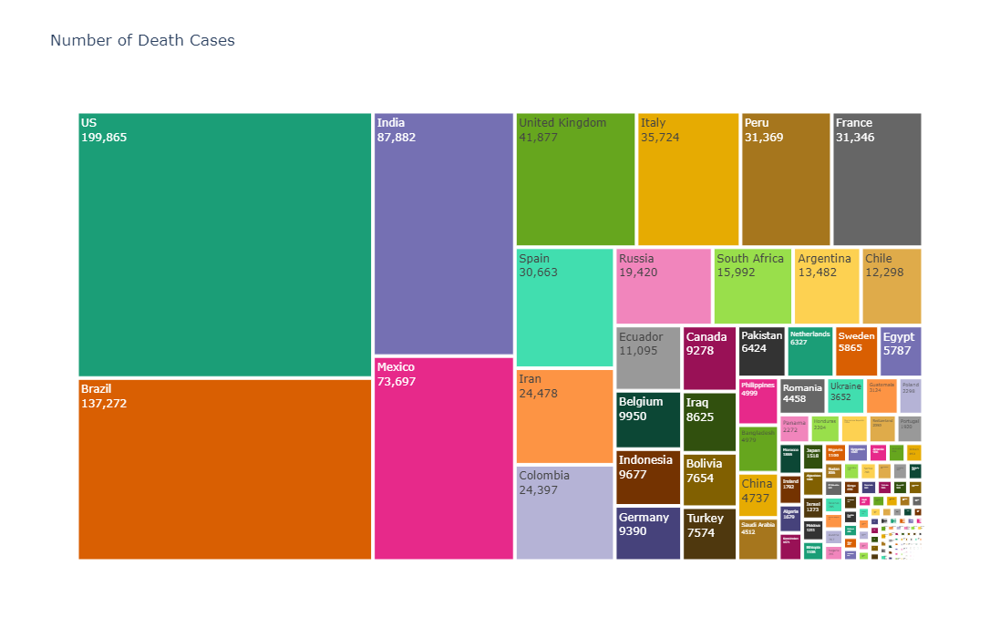

In [59]:

fig = px.treemap(country_wise.sort_values(by='Deaths', ascending=False).reset_index(drop=True),
                 path=['Country'], values='Deaths', height=700,
                 title='Number of Death Cases',
                 color_discrete_sequence=px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'
fig.show()


## Model selection and Evaluation

# Worldwide Confirmed cases prediction

In [87]:
cols = confirmed_df.keys()

conf = confirmed_df.loc[:, cols[4]:cols[-1]]
deat = deaths_df.loc[:, cols[4]:cols[-1]]
reco = recovered_df.loc[:, cols[4]:cols[-1]]

world_cases = []
total_deaths = [] 
recovery_rate = []
total_recovered = [] 

for i in dates:
    confirmed_sum = conf[i].sum()
    death_sum = deat[i].sum()
    recovered_sum = reco[i].sum()
    
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)

In [61]:
import datetime
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

days_in_future = 30
future_forecast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forecast[:-30]

start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forecast_dates = []
for i in range(len(future_forecast)):
    future_forecast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

## Importing necessary modules

In [62]:

from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score

In [63]:


from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR 
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
from prophet import Prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from neuralprophet import NeuralProphet
from neuralprophet import set_random_seed

### Model selection

In [64]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22, world_cases, test_size=0.3, shuffle=False, random_state = 42) 

In [65]:
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forecast = poly.fit_transform(future_forecast)

In [66]:
linear_model = LinearRegression()
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forecast)
poli_rmse = math.sqrt(mean_squared_error(test_linear_pred, y_test_confirmed))
print('MAE:',math.sqrt(mean_absolute_error(test_linear_pred, y_test_confirmed)))
print('MSE:',math.sqrt(mean_squared_error(test_linear_pred, y_test_confirmed)))

MAE: 1439.233133413478
MSE: 2242290.2859678613


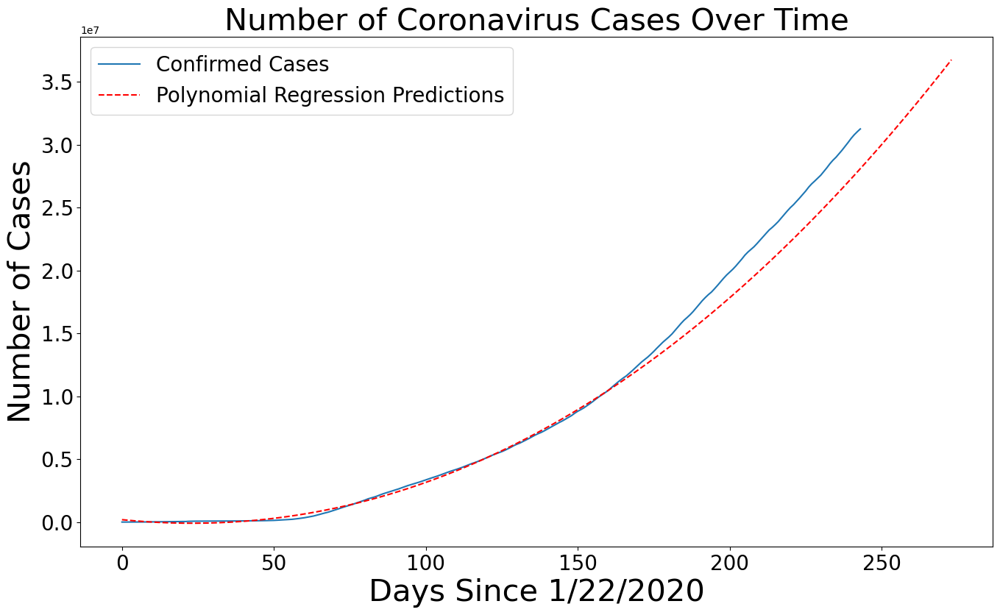

In [67]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(16, 9))
    plt.plot(x, y)
    plt.plot(future_forecast, pred, linestyle='dashed', color=color)
    plt.title('Number of Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('Number of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'red')

In [68]:
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed,np.ravel(y_train_confirmed, order='c'))
svm_pred = svm_confirmed.predict(future_forecast)

RMSE: 2733759.7639696263


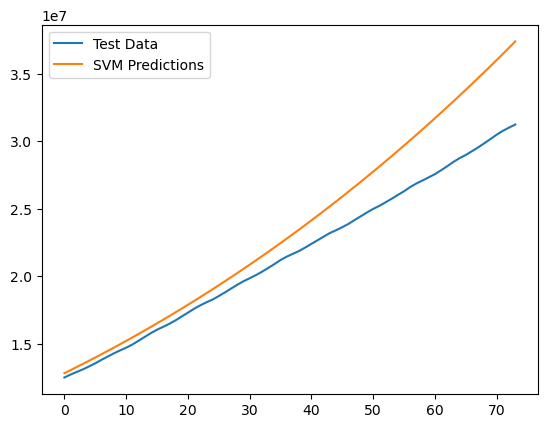

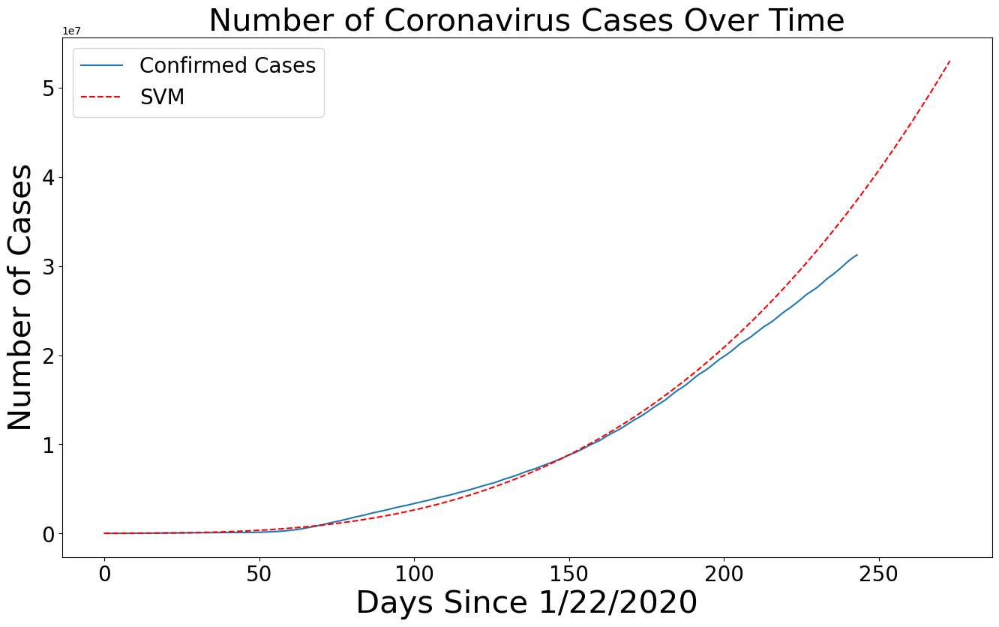

In [69]:
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
svm_rmse = math.sqrt(mean_squared_error(svm_test_pred, y_test_confirmed))
print('RMSE:',svm_rmse)

plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM', 'red')

# Covid-19 Cases Prediction In India

In [70]:
indian_cases = confirmed_df[confirmed_df['Country/Region'] == 'India']


In [71]:
indian_cases

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,9/12/20,9/13/20,9/14/20,9/15/20,9/16/20,9/17/20,9/18/20,9/19/20,9/20/20,9/21/20
143,NaN,India,20.593684,78.96288,0,0,0,0,0,0,...,4754356,4846427,4930236,5020359,5118253,5214677,5308014,5400619,5487580,5487580


In [75]:
dates = indian_cases.columns[4:]


In [86]:
indian_conf_cases = indian_cases.melt(
    
    value_vars=dates,
    var_name = 'Date',
    value_name='Confirmed'
)
indian_conf_cases

,Date,Confirmed
0,1/22/20,0
1,1/23/20,0
2,1/24/20,0
3,1/25/20,0
4,1/26/20,0
...,...,...
239,9/17/20,5214677
240,9/18/20,5308014
241,9/19/20,5400619
242,9/20/20,5487580


In [77]:
indian_conf_cases.columns

Index(['Date', 'Confirmed'], dtype='object')

In [78]:
indian_conf_cases = indian_conf_cases.rename(columns = {'Date':'ds', 'Confirmed':'y'})

In [79]:
class Fbprophet(object):
    def fit(self,data):
        
        self.data  = data
        self.model = Prophet(weekly_seasonality=True,daily_seasonality=False,yearly_seasonality=False)
        self.model.fit(self.data)
    
    def forecast(self,periods,freq):
        
        self.future = self.model.make_future_dataframe(periods=periods,freq=freq)
        self.df_forecast = self.model.predict(self.future)
        
    def plot(self,xlabel="Years",ylabel="Values"):
        
        self.model.plot(self.df_forecast,xlabel=xlabel,ylabel=ylabel,figsize=(9,4))
        self.model.plot_components(self.df_forecast,figsize=(9,6))
        
    def R2(self):
        return r2_score(self.data.y, self.df_forecast.yhat[:len(indian_conf_cases)])
    

In [80]:
model = Fbprophet()
model.fit(indian_conf_cases)
model.forecast(30,"D")

13:35:36 - cmdstanpy - INFO - Chain [1] start processing
13:35:40 - cmdstanpy - INFO - Chain [1] done processing


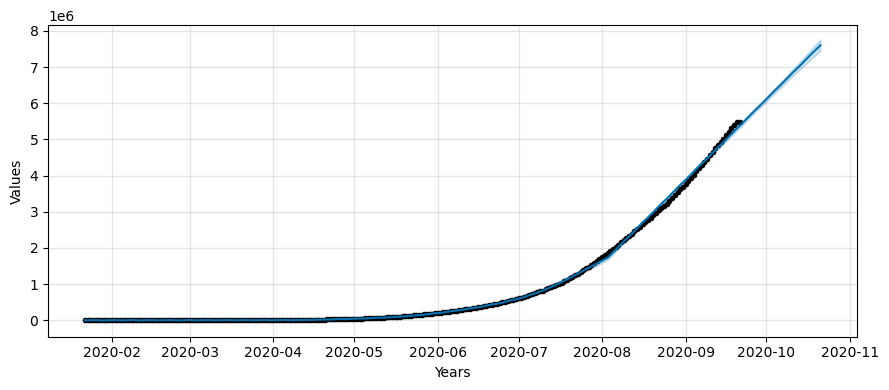

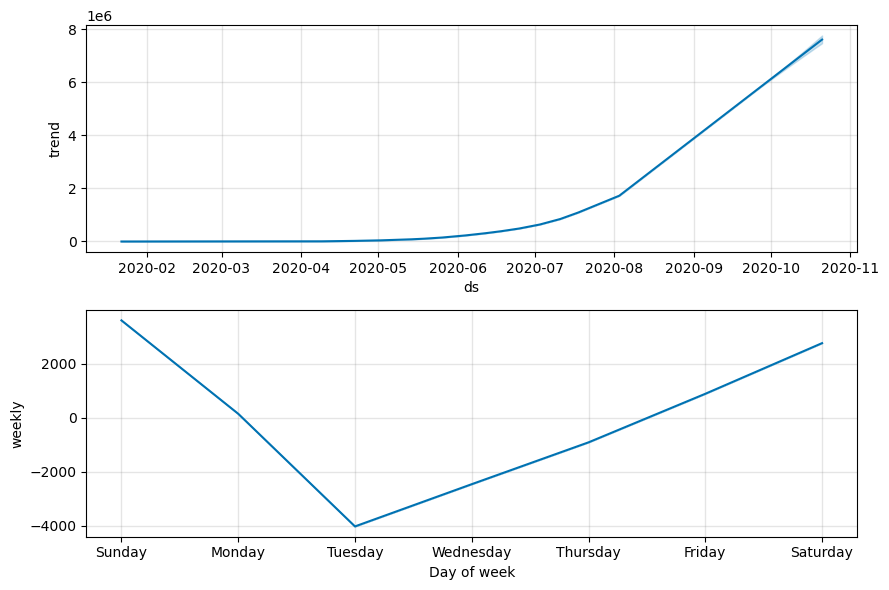

In [81]:
model.plot()

In [82]:
model.R2()

0.9990641790251479

In [83]:
forecast = model.df_forecast[["ds","yhat_lower","yhat_upper","yhat"]].tail(30).reset_index().set_index("ds").drop("index",axis=1)
forecast.head()

,yhat_lower,yhat_upper,yhat
ds,,,
2020-09-22,5.386450e+06,5.498007e+06,5.443553e+06
2020-09-23,5.461863e+06,5.581766e+06,5.519588e+06
2020-09-24,5.537186e+06,5.656555e+06,5.595608e+06
2020-09-25,5.613486e+06,5.732242e+06,5.671877e+06
2020-09-26,5.687559e+06,5.807776e+06,5.748224e+06


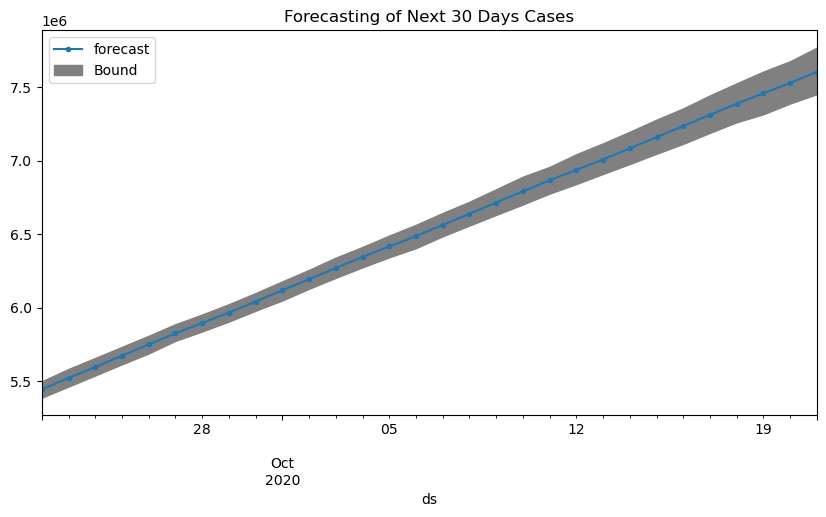

In [84]:
forecast["yhat"].plot(marker=".",figsize=(10,5))
plt.fill_between(x=forecast.index, y1=forecast["yhat_lower"], y2=forecast["yhat_upper"],color="gray")
plt.legend(["forecast","Bound"],loc="upper left")
plt.title("Forecasting of Next 30 Days Cases")
plt.show()